[![Open in Colab] (https://colab.research.google.com/assets/colab-badge.svg) ](https://colab.research.google.com/github/me-WaqasIqrar/Panoramic-Tooth-Segmentation/blob/main/DIP_Project.ipynb)

In [2]:
!pip install -q gdown
import zipfile
import gdown


In [3]:
!git clone https://github.com/me-WaqasIqrar/Panoramic-Tooth-Segmentation.git

Cloning into 'Panoramic-Tooth-Segmentation'...
remote: Enumerating objects: 503, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 503 (delta 2), reused 11 (delta 2), pack-reused 489 (from 2)
Receiving objects: 100% (503/503), 308.62 MiB | 25.83 MiB/s, done.
Resolving deltas: 100% (21/21), done.


In [4]:
import sys
sys.path.append("/content/Panoramic-Tooth-Segmentation")

In [5]:
%cd /content/Panoramic-Tooth-Segmentation
#!pip install -qr requirements.txt
#You can  use pip install however colab includes all libraries so we dont need them

/content/Panoramic-Tooth-Segmentation


In [6]:
import os
path="/content/Data"
if os.path.exists(path) == False:
  os.mkdir(path)
  !gdown --id 12b6kN-wzDKQfZ7bOVSK1BLv1VztVTy5d -O /content/Data/DentalPanoramicXrays.zip
  print("Download Completed")
  !unzip /content/Data/DentalPanoramicXrays.zip -d /content/Data

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=12b6kN-wzDKQfZ7bOVSK1BLv1VztVTy5d
From (redirected): https://drive.google.com/uc?id=12b6kN-wzDKQfZ7bOVSK1BLv1VztVTy5d&confirm=t&uuid=3115629f-69b9-4fb3-a64d-fae292df1861
To: /content/Data/DentalPanoramicXrays.zip
100% 325M/325M [00:02<00:00, 119MB/s]
Download Completed
Archive:  /content/Data/DentalPanoramicXrays.zip
   creating: /content/Data/Segmentation2/
  inflating: /content/Data/Segmentation2/1.png  
  inflating: /content/Data/Segmentation2/10.png  
  inflating: /content/Data/Segmentation2/100.png  
  inflating: /content/Data/Segmentation2/101.png  
  inflating: /content/Data/Segmentation2/102.png  
  inflating: /content/Data/Segmentation2/103.png  
  inflating: /content/Data/Segmentation2/104.png  
 

In [7]:
from images_prepare import *
#pre_images(resize_shape,path,include_zip)
X,X_sizes=pre_images((512,512),path,True)

In [8]:
from masks_prepare import *
#Y=pre_masks(resize_shape=(512,512),path='/content/Segmentation-of-Teeth-in-Panoramic-X-ray-Image/Original_Masks')  ORIGINALL MASKS function
Y=pre_splitted_masks(path='/content/Panoramic-Tooth-Segmentation/Custom_Masks') #Custom Splitted MASKS size 512x512


In [9]:
X=np.float32(X/255)
Y=np.float32(Y/255)

In [10]:
x_train=X[:105,:,:,:]
y_train=Y[:105,:,:,:]
x_test=X[105:,:,:,:]
y_test=Y[105:,:,:,:]

In [11]:
import random
import matplotlib.pyplot as plt
random_number=random.randint(0,104)
print(random_number)

27


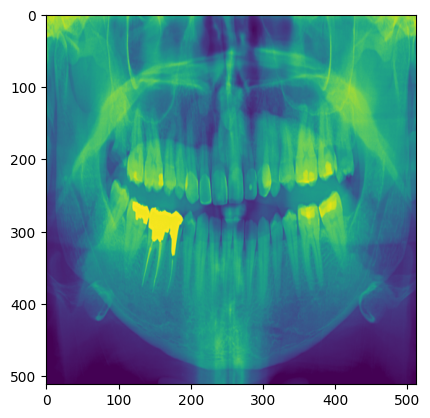

In [12]:
#Checking data X  and Y matching
plt.imshow(x_train[random_number,:,:,0])

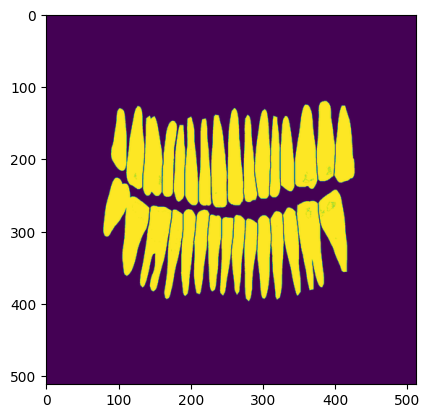

In [13]:
#Checking data X  and Y matching
plt.imshow(y_train[random_number,:,:,0])

In [14]:
from model import *
model=UNET(input_shape=(512,512,1),last_activation='sigmoid')
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        320 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512, 512,  │          0 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │      9,248 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │     36,928 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │    147,584 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_2[

 Total params: 13,423,361 (51.21 MB)

 Trainable params: 13,420,481 (51.20 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [15]:
model.compile(optimizer ='adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
#Your choice batch and epoch
model.fit(x_train,y_train,batch_size=16,epochs=150,verbose=1)

Epoch 1/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 234s 16s/step - accuracy: 0.7317 - loss: 0.5419
Epoch 2/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.7890 - loss: 0.3632
Epoch 3/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.8386 - loss: 0.2423
Epoch 4/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.8558 - loss: 0.2090
Epoch 5/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8719 - loss: 0.1888
Epoch 6/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.8724 - loss: 0.1676
Epoch 7/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8783 - loss: 0.1592
Epoch 8/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.8846 - loss: 0.1464
Epoch 9/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.8821 - loss: 0.1417
Epoch 10/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8893 - loss: 0.1337
Epoch 11/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8886 - loss: 0.1292
Epoch 12/150
7/7 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.8926 - loss: 0.1201

In [ ]:
#Download the model From google drive

!gdown --id 1LzOy1RtJ-8u4xER0kLhEtFNpImsJWh

In [ ]:
from tensorflow import keras
model = keras.models.load_model('/content/trained_model.h5')

In [32]:
predict_img=model.predict(x_test)
##model.save(path)
predict=predict_img[1,:,:,0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


In [20]:
model.save('/content/trained_model.h5')


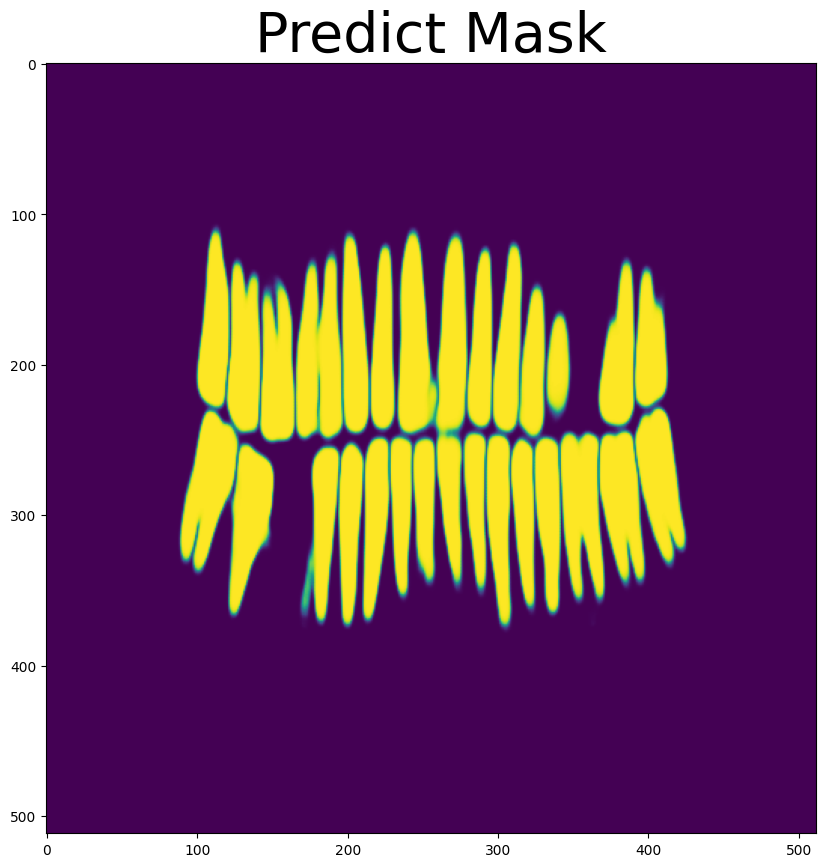

In [33]:

plt.figure(figsize = (20,10))
plt.title("Predict Mask",fontsize = 40)
plt.imshow(predict)
#For CCA, we saved
plt.imsave("/content/predict.png",predict)

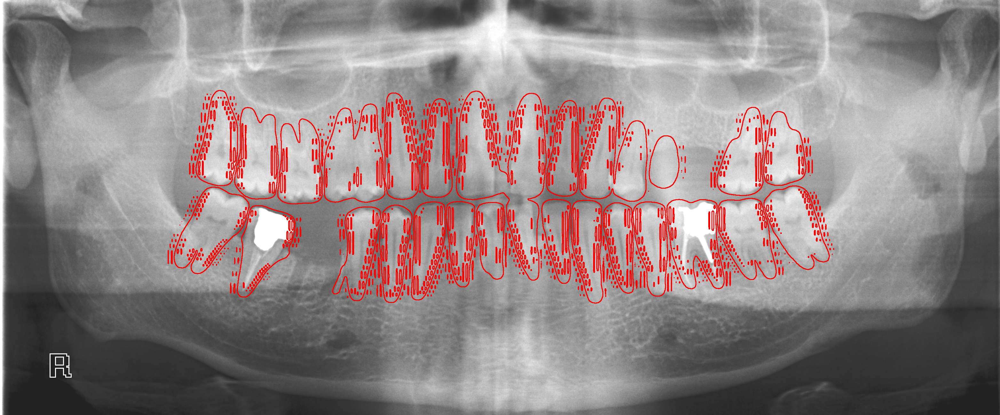

In [34]:
from google.colab.patches import cv2_imshow
import cv2
from CCA_Analysis import *


##Plotting - RESULT Example
img=cv2.imread("/content/Data/Images/107.png")#original img 107.png

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

mask=np.uint8(predict1*255)#
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts,hieararch=cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

img = cv2.drawContours(img.copy(), cnts, -1, (0, 0, 255), 2)  # Red in BGR
#img = cv2.drawContours(img[:,:,0], cnts, -1, (255, 0, 0) , 2)
#img = cv2.UMat.get(img)
cv2_imshow(img)

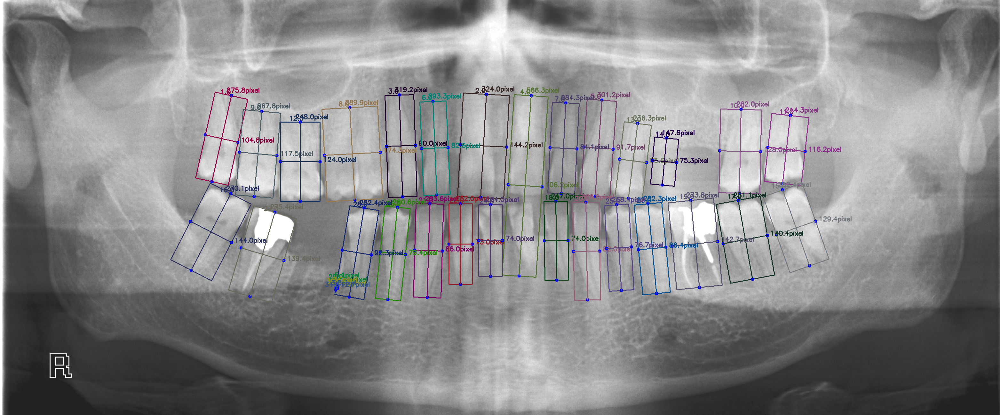

In [35]:
from google.colab.patches import cv2_imshow
import cv2
from CCA_Analysis import *


##Plotting - RESULT Example with CCA_Analysis
img=cv2.imread("/content/Data/Images/107.png")#original img 107.png

#load image (mask was saved by matplotlib.pyplot)
predicted=cv2.imread("/content/predict.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

cca_result,teeth_count=CCA_Analysis(img,predicted,3,2)
cv2_imshow(cca_result)

In [36]:
print(teeth_count,"Teeth Count")

28 Teeth Count
